# Outlier Method of Filtering

**Mostafa Kamal Mostafa Kamel (mos.kamal@nu.edu.eg)**


In [1]:
from glob import glob
from pathlib import Path
import pandas as pd

import matplotlib.pyplot as plt
import numpy as np
from numpy.typing import NDArray
from PIL import Image, ImageEnhance, ImageOps
from rich.progress import track
from scipy.signal import medfilt
import warnings
import seaborn as sns

# cookoo dataset

# anisotropic diffusion
# CNN post processing
warnings.filterwarnings("ignore")
path_to_images = Path().resolve().joinpath("BSDS300-test")
image_paths = glob(f"{str(path_to_images)}/*.jpg")

## Implementing the algorithm steps

### Reading an Image and transofrming to grayscale


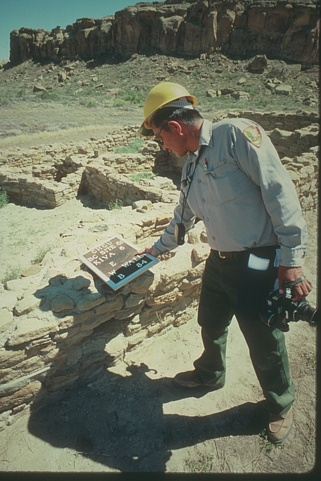

In [2]:
im = Image.open(image_paths[16])
im

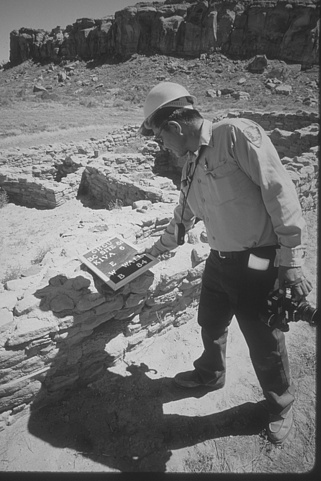

In [3]:
im_gs = im.convert("L")
im_gs


In [4]:
arr = np.array(im_gs)  # convert the PIL image object to array


### This step is not part of the algorithm!

we implement a function to apply salt and pepper noise to given image. the ratio parameter specifies the percentage of the original image pixels that are going to be replaced by black and white pixels. each replaced pixel has 50% probability of being replace by a black (0.) or white (255.) pixel


In [5]:
def apply_salt_pepper(arr, ratio=0.1):
    flat = arr.flatten()
    tot_number_of_pixels = len(flat)
    number_of_pixels_to_be_replaced = round(tot_number_of_pixels * ratio)
    pixels_to_be_replaced = np.random.choice(
        range(tot_number_of_pixels),
        size=(number_of_pixels_to_be_replaced,),
        replace=False,
    )
    flat[pixels_to_be_replaced[: round(number_of_pixels_to_be_replaced / 2)]] = 0.0
    flat[pixels_to_be_replaced[-round(number_of_pixels_to_be_replaced / 2) :]] = 255.0
    return np.uint8(flat.reshape(arr.shape))


In [6]:
seasoned_arr = apply_salt_pepper(arr, ratio=0.65)

## Find all pixels whose values are 255 or 0


In [7]:
paded_seasoned_arr = np.pad(seasoned_arr, (1, 1), "edge")
indices_of_salt_pepper = np.argwhere((seasoned_arr == 0) | (seasoned_arr == 255))
indices_of_salt_pepper


array([[  0,   0],
       [  0,   1],
       [  0,   2],
       ...,
       [480, 317],
       [480, 318],
       [480, 320]])

## Extract 9x9 kernels surrounding each pixel found in the previous step

the function below return the slices defining the 9x9 kernel surrounding each pixel identified in the previous step


In [8]:
def get_kernel_slices(original_arr_indices, size=3):
    x, y = original_arr_indices + 1
    return slice(x - 1, x + 2), slice(y - 1, y + 2)


In [9]:
all_kernels = [
    paded_seasoned_arr[get_kernel_slices(salt_and_pepper_pixel)]
    for salt_and_pepper_pixel in indices_of_salt_pepper
]


In [10]:
x1 = next(filter(lambda x: x[1, 1] == 255, all_kernels))
x1


array([[  0, 255, 255],
       [  0, 255, 255],
       [  0,   0, 117]], dtype=uint8)

In [11]:
x1 - 255

array([[  1,   0,   0],
       [  1,   0,   0],
       [  1,   1, 118]], dtype=uint8)

In [12]:
x2 = next(filter(lambda x: x[1, 1] == 0, all_kernels))
x2


array([[0, 0, 0],
       [0, 0, 0],
       [0, 0, 0]], dtype=uint8)

In [13]:
x2 - 255

array([[1, 1, 1],
       [1, 1, 1],
       [1, 1, 1]], dtype=uint8)

## Calculate an array of means of all the kernels in the previous step


In [14]:
z = list(
    map(
        lambda kernel: (
            np.mean(kernel.astype(np.float64)[(kernel > 0) & (kernel < 255)])
            - kernel[1, 1]
        ).astype(np.uint8),
        all_kernels,
    )
)


Calculate the histogram of kernel means


In [15]:
counts, values = np.histogram(z, bins=range(0, 256, 5))


In [16]:
def plot_single_image(seasoned_arr):
    fig = plt.figure(
        figsize=(
            10,
            20,
        ),
        dpi=80,
    )
    gs = fig.add_gridspec(1, 1, hspace=0.12, wspace=0.08)
    ax = gs.subplots(sharex="col", sharey="row")
    ax.imshow(seasoned_arr, cmap="gray", vmin=0, vmax=255)
    ax.set_axis_off()

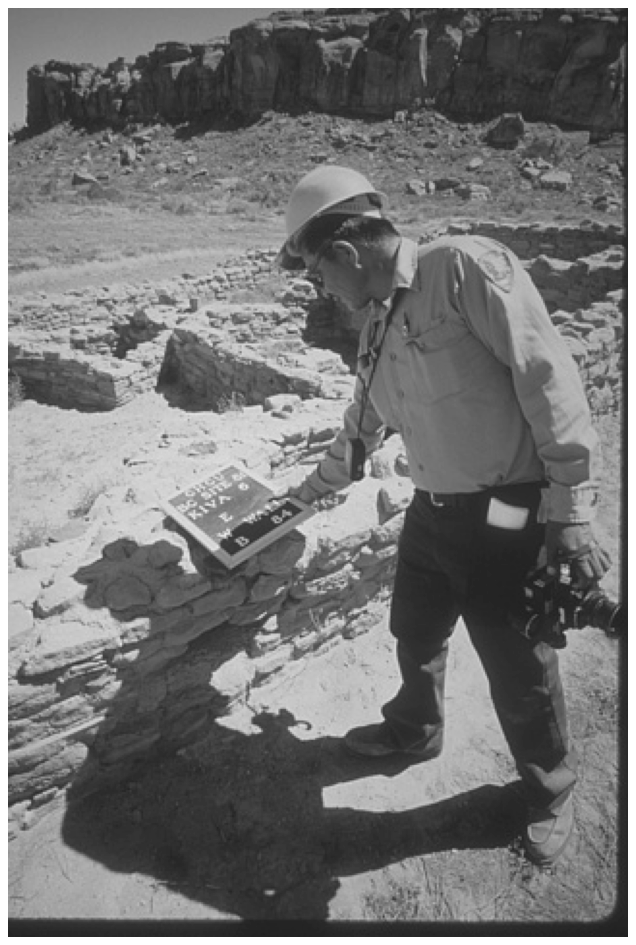

In [17]:
plot_single_image(arr)


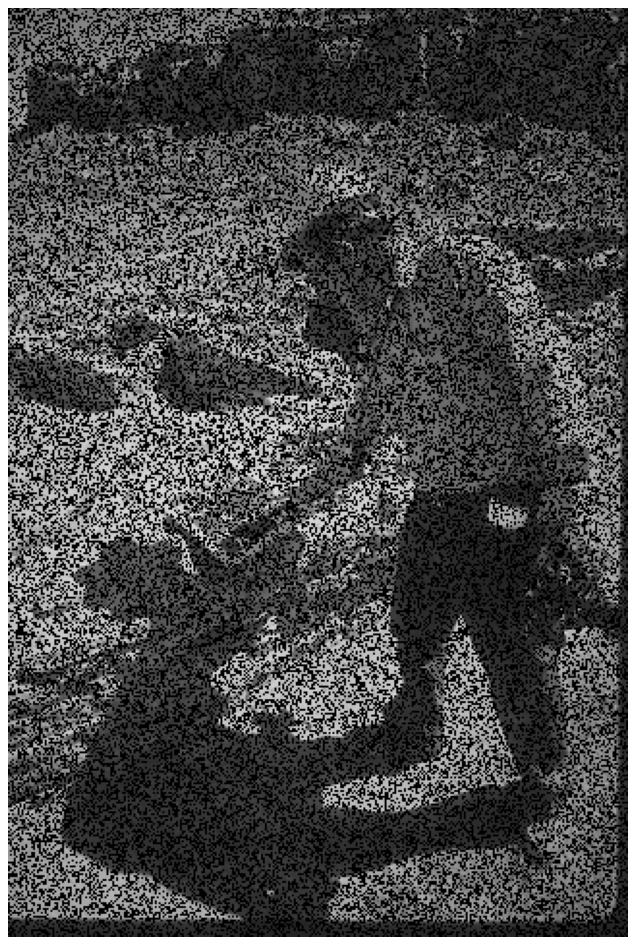

In [18]:
seasoned_arr = apply_salt_pepper(arr, ratio=0.4)


plot_single_image(seasoned_arr + 1)

In [19]:
# plt.hist(arr, bins=range(0, 255, 5))


In [20]:
np.diff(counts.tolist() + [0, 0]) < 0


array([ True, False, False, False, False, False, False, False, False,
       False,  True,  True,  True,  True,  True, False, False, False,
       False,  True,  True, False, False, False, False, False,  True,
        True,  True, False, False, False, False,  True,  True, False,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True, False, False, False, False, False])

Calculate the discreate difference along the array. the first local minima should correspond to the first negative value in the differences array as could be seen from the plot below


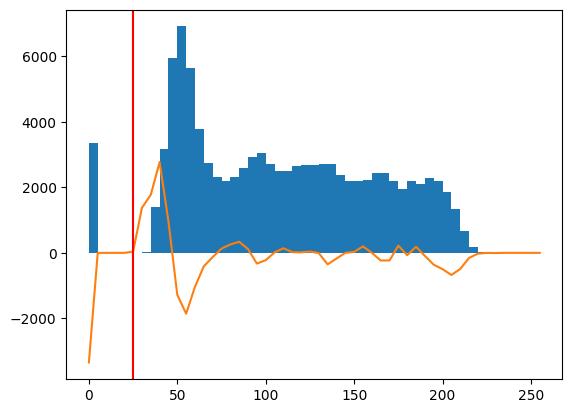

In [21]:
counts, values = np.histogram(z, bins=range(0, 256, 5))
threshold = values[np.diff(counts.tolist() + [0, 0]) > 0][0]
plt.hist(z, bins=range(0, 256, 5))
plt.plot(range(0, 256, 5), np.diff(counts).tolist() + [0] + [0])
plt.axvline(threshold, color="r")


(array([3.343e+03, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        3.500e+01, 1.409e+03, 3.181e+03, 5.952e+03, 6.905e+03, 5.624e+03,
        3.770e+03, 2.736e+03, 2.327e+03, 2.199e+03, 2.329e+03, 2.586e+03,
        2.924e+03, 3.038e+03, 2.712e+03, 2.489e+03, 2.503e+03, 2.644e+03,
        2.666e+03, 2.682e+03, 2.724e+03, 2.717e+03, 2.367e+03, 2.194e+03,
        2.194e+03, 2.225e+03, 2.422e+03, 2.425e+03, 2.192e+03, 1.961e+03,
        2.181e+03, 2.110e+03, 2.297e+03, 2.206e+03, 1.845e+03, 1.348e+03,
        6.740e+02, 1.830e+02, 3.000e+01, 6.000e+00, 5.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00]),
 array([  0.,   5.,  10.,  15.,  20.,  25.,  30.,  35.,  40.,  45.,  50.,
         55.,  60.,  65.,  70.,  75.,  80.,  85.,  90.,  95., 100., 105.,
        110., 115., 120., 125., 130., 135., 140., 145., 150., 155., 160.,
        165., 170., 175., 180., 185., 190., 195., 200., 205., 210., 215.,
        220., 225., 230., 235., 240., 245., 250., 255.]),
 <BarContai

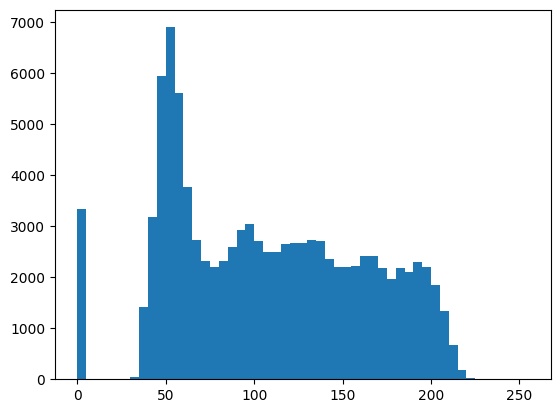

In [22]:
plt.hist(z, bins=range(0, 256, 5))


## Performing outlier filtering using that threshold


In [23]:
def filter_below_threshold(kernel, threshold, size):
    kernel_center = int((size - 1) / 2)
    mean = (
        (np.sum(kernel.astype(np.float64)) - kernel[kernel_center, kernel_center]) / 8
    ).astype(np.uint8)
    if np.abs(float(kernel[kernel_center, kernel_center] - mean)) > (threshold):
        kernel[kernel_center, kernel_center] = mean
    return kernel.astype(np.uint8)

In [24]:
for index in indices_of_salt_pepper:
    slices = get_kernel_slices(index)
    paded_seasoned_arr[slices] = filter_below_threshold(
        paded_seasoned_arr[slices], threshold, size=3
    )


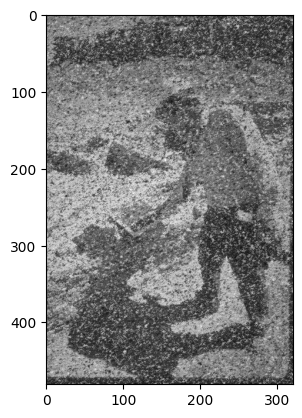

In [25]:
plt.imshow(paded_seasoned_arr[1:-1, 1:-1], cmap="gray")


# Putting it all together


In [26]:
def get_kernel_slices(original_arr_indices, size=3, pad=True):
    kernel_center = int((size - 1) / 2)
    x, y = original_arr_indices + (kernel_center if pad else 0)
    return slice(x - size + kernel_center + 1, x + size - kernel_center), slice(
        y - size + kernel_center + 1, y + size - kernel_center
    )


def filter_below_threshold(kernel, threshold, size):
    kernel_center = int((size - 1) / 2)
    mean = (
        (np.sum(kernel.astype(np.float64)) - kernel[kernel_center, kernel_center]) / 8
    ).astype(np.uint8)
    if np.abs(float(kernel[kernel_center, kernel_center] - mean)) > threshold:
        kernel[kernel_center, kernel_center] = mean
    return kernel.astype(np.uint8)


def adaptive_outlier_filter(
    grayscale_im: NDArray[np.uint8], size: int = 3
) -> NDArray[np.uint8]:
    arr = np.array(grayscale_im)
    padded_arr = np.pad(arr, (int((size - 1) / 2), int((size - 1) / 2)), "edge")
    indices_of_salt_pepper = np.argwhere((arr == 0) | (arr == 255))
    all_kernels = list(
        filter(
            lambda x: x.shape == (size, size),
            [
                padded_arr[get_kernel_slices(salt_and_pepper_pixel, size)]
                for salt_and_pepper_pixel in indices_of_salt_pepper
            ],
        )
    )
    kernel_center = int((size - 1) / 2)
    kernel_means_array = list(
        map(
            lambda kernel: (
                np.mean(kernel.astype(np.float64)[(kernel > 0) & (kernel < 255)])
                - kernel[kernel_center, kernel_center]
            ).astype(np.uint8),
            all_kernels,
        )
    )
    counts, values = np.histogram(kernel_means_array, bins=range(0, 256, 5))
    threshold = values[np.diff(counts.tolist() + [0, 0]) < 0][0] + 15
    for index in indices_of_salt_pepper:
        slices = get_kernel_slices(index, size)
        padded_arr[slices] = filter_below_threshold(
            padded_arr[slices], threshold, size=size
        )
    return padded_arr[
        int((size - 1) / 2) : -int((size - 1) / 2),
        int((size - 1) / 2) : -int((size - 1) / 2),
    ]

In [27]:
def coerce_to_array(im):
    return im if isinstance(im, np.ndarray) else np.array(im)


def coerce_to_PIL(im):
    return Image.fromarray(im) if isinstance(im, np.ndarray) else im


def signal_to_noise_ratio(original, transformed):
    # sourcery skip: assign-if-exp, reintroduce-else
    original = coerce_to_array(original)
    transformed = coerce_to_array(transformed)
    mse = np.mean((original.astype("int64") - transformed.astype("int64")) ** 2)
    if mse == 0:
        return 100
    return 10 * np.log10((255**2) / mse)


In [28]:
def plot_denoise(im, sp_ratio=0.05, save_path=None, size=3):
    im_gs = im.convert("L")
    arr = np.array(im_gs)  # convert the PIL image object to array
    seasoned_arr = apply_salt_pepper(arr, ratio=sp_ratio)
    corrected_image = adaptive_outlier_filter(seasoned_arr, size)
    median_filter_corrected_image = medfilt(seasoned_arr, size)
    noise_snr = signal_to_noise_ratio(im_gs, seasoned_arr)
    aof_snr = signal_to_noise_ratio(im_gs, corrected_image)
    med_snr = signal_to_noise_ratio(im_gs, median_filter_corrected_image)
    fig = plt.figure(
        figsize=(
            im_gs.size[0] * 1 / 20,
            im_gs.size[1] * 1 / 20,
        ),
        dpi=80,
    )
    gs = fig.add_gridspec(2, 2, hspace=0.12, wspace=0.08)
    axes = gs.subplots(sharex="col", sharey="row")
    list(map(lambda ax: ax.set_axis_off(), axes.flatten()))
    list(
        map(
            lambda input: input[0].set_title(input[1]),
            zip(
                axes.flatten(),
                [
                    "Original",
                    f"Noisy Image {round(noise_snr, 2)} dB",
                    f"Median Filter {round(med_snr, 2)} dB",
                    f"Corrected Image {round(DTOF_snr, 2)} dB",
                ],
            ),
        )
    )
    axes[0][0].imshow(im_gs, cmap="gray", vmin=0, vmax=255)
    axes[0][1].imshow(seasoned_arr, cmap="gray", vmin=0, vmax=255)
    axes[1][0].imshow(median_filter_corrected_image, cmap="gray", vmin=0, vmax=255)
    axes[1][1].imshow(corrected_image, cmap="gray", vmin=0, vmax=255)
    if save_path:
        Path(save_path).parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path)
        plt.close()
    return noise_snr, med_snr, aof_snr, corrected_image


array([[115, 114, 155, ...,  61,  51,  40],
       [117, 116, 116, ...,  45,  40,  38],
       [117, 116, 117, ...,  94,  92,  90],
       ...,
       [ 37,  38,  39, ...,  34,  35,  35],
       [ 36,  51,  38, ...,  29,  34,  25],
       [ 36,  48,  37, ...,  35,  33,  23]], dtype=uint8)

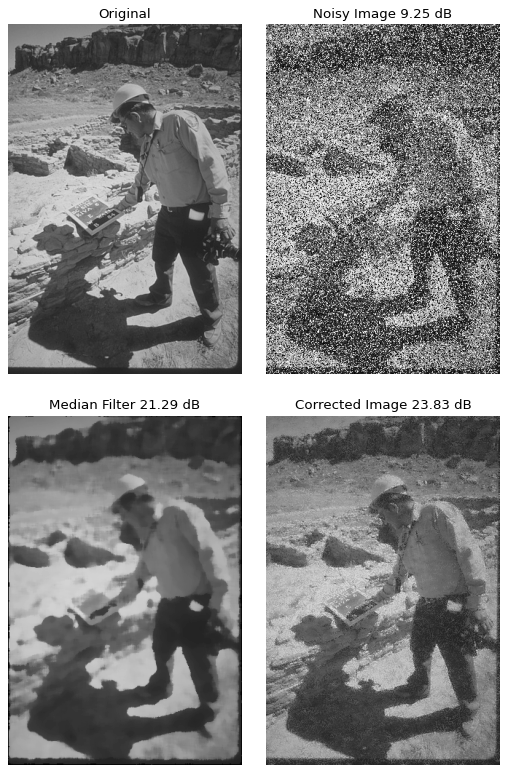

In [29]:
im = Image.open(image_paths[16])
from seasalt.seasalt import plot_denoise

plot_denoise(40, im, sp_ratio=0.4, size=9)

(18.313477203351848, 27.398953280684463, 36.8188060234027)

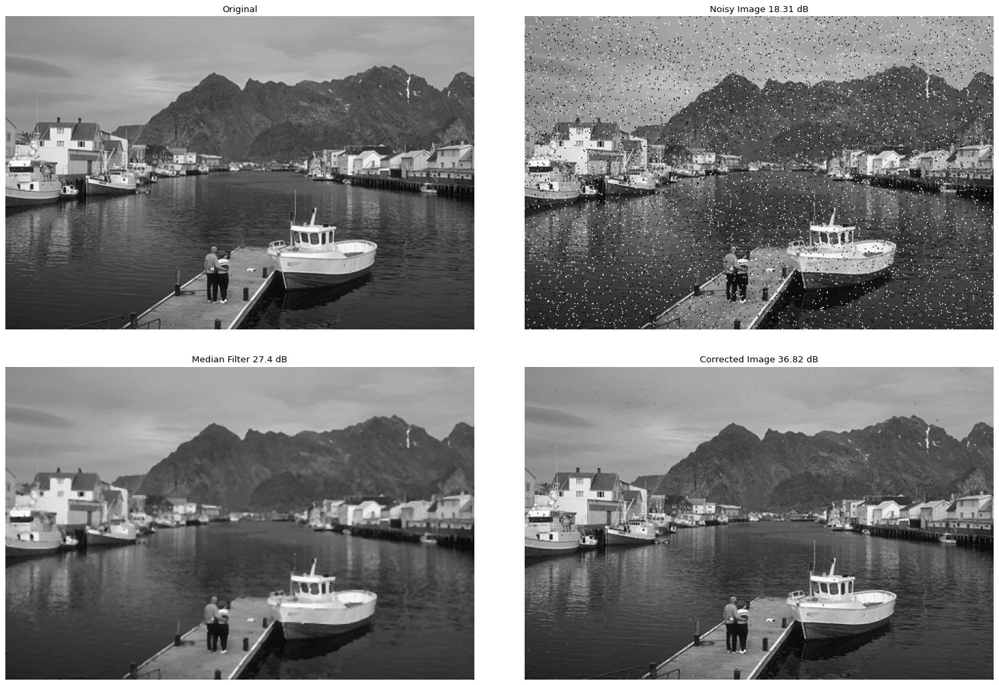

In [ ]:
im = Image.open(image_paths[19])
plot_denoise(im)

(18.191489569209452, 22.78634762600376, 28.405895279909075)

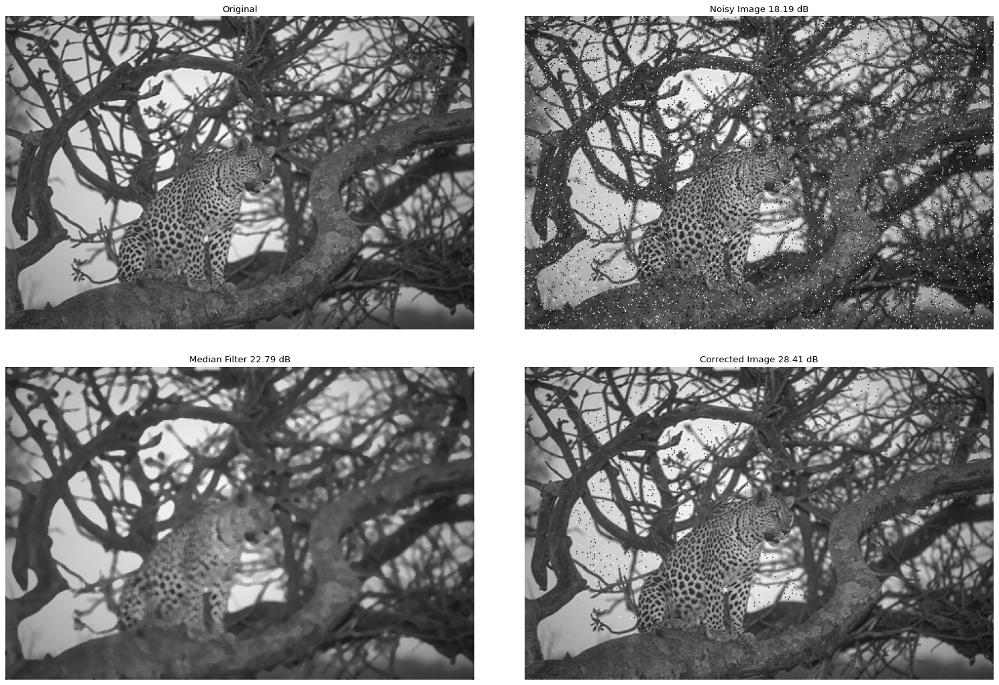

In [ ]:
im = Image.open(image_paths[9])
plot_denoise(im)

# Applying to the results of histogram equalization


In [ ]:
def plot_transformation_hist_eq(im, darkening_ratio, save_path=None, size=3):
    im_gs = im.convert("L")
    enhancer = ImageEnhance.Brightness(im_gs)
    im_dark = enhancer.enhance(darkening_ratio)
    im_eq = ImageOps.equalize(im_dark, mask=None)
    arr = np.array(im_eq)  # convert the PIL image object to array
    corrected_image = adaptive_outlier_filter(arr, size)
    median_filter_corrected_image = medfilt(arr, 5)
    fig = plt.figure(
        figsize=(
            im_gs.size[0] * 1 / 20,
            im_gs.size[1] * 1 / 20,
        ),
        dpi=80,
    )
    gs = fig.add_gridspec(2, 3, hspace=0.12, wspace=0.08)
    axes = gs.subplots(sharex="col", sharey="row")
    eq_snr = signal_to_noise_ratio(im_gs, im_eq)
    aof_snr = signal_to_noise_ratio(im_gs, corrected_image)
    med_snr = signal_to_noise_ratio(im_gs, median_filter_corrected_image)
    list(map(lambda ax: ax.set_axis_off(), axes.flatten()))
    list(
        map(
            lambda input: input[0].set_title(input[1]),  # type: ignore
            zip(
                axes.flatten(),
                [
                    "Original",
                    "Darkened Image",
                    "",
                    f"Histogram equalization applied {round(eq_snr, 2)} dB",
                    f"transformation applied {round(aof_snr, 2)} dB",
                    f"median filter applied {round(med_snr, 2)} dB",
                ],
            ),
        )
    )
    axes[0][0].imshow(im_gs, cmap="gray", vmin=0, vmax=255)
    axes[0][1].imshow(im_dark, cmap="gray", vmin=0, vmax=255)
    axes[1][0].imshow(im_eq, cmap="gray", vmin=0, vmax=255)
    axes[1][1].imshow(corrected_image, cmap="gray", vmin=0, vmax=255)
    axes[1][2].imshow(median_filter_corrected_image, cmap="gray", vmin=0, vmax=255)
    if save_path:
        Path(save_path).parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path)
        plt.close()
    return eq_snr, aof_snr, med_snr

(11.730087839746538, 11.629661696512306)

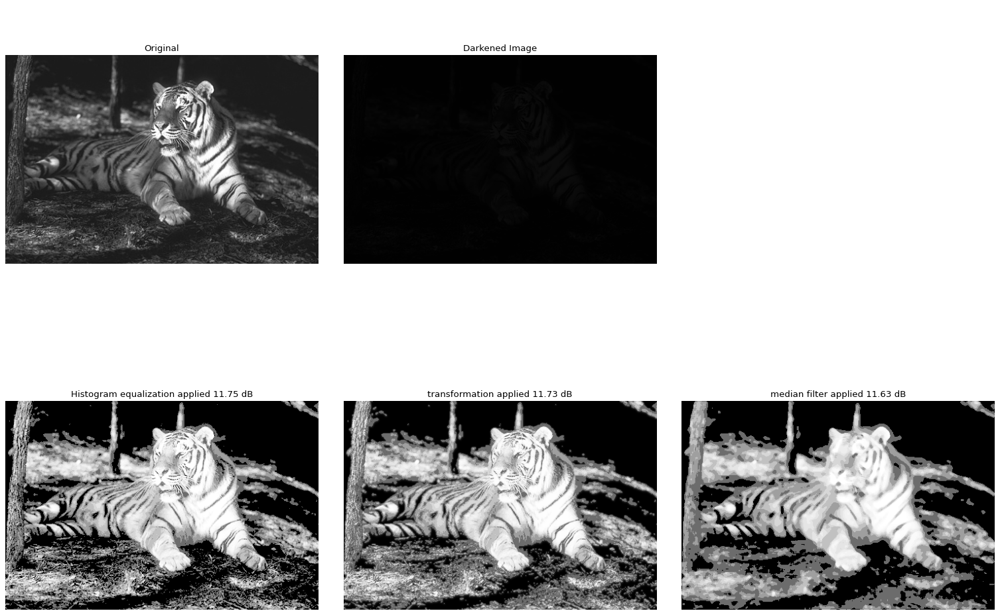

In [ ]:
im = Image.open(image_paths[8])
plot_transformation_hist_eq(im, 0.05)


(18.84592834593861, 18.655742463499084)

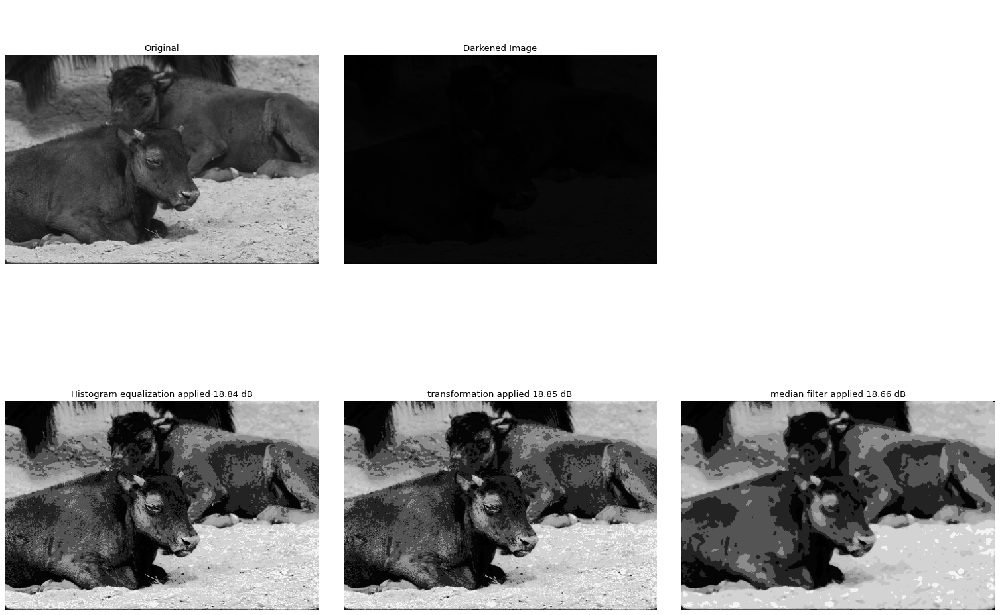

In [ ]:
im = Image.open(image_paths[3])
plot_transformation_hist_eq(im, 0.05)


(15.022991807061747, 15.363379894608407)

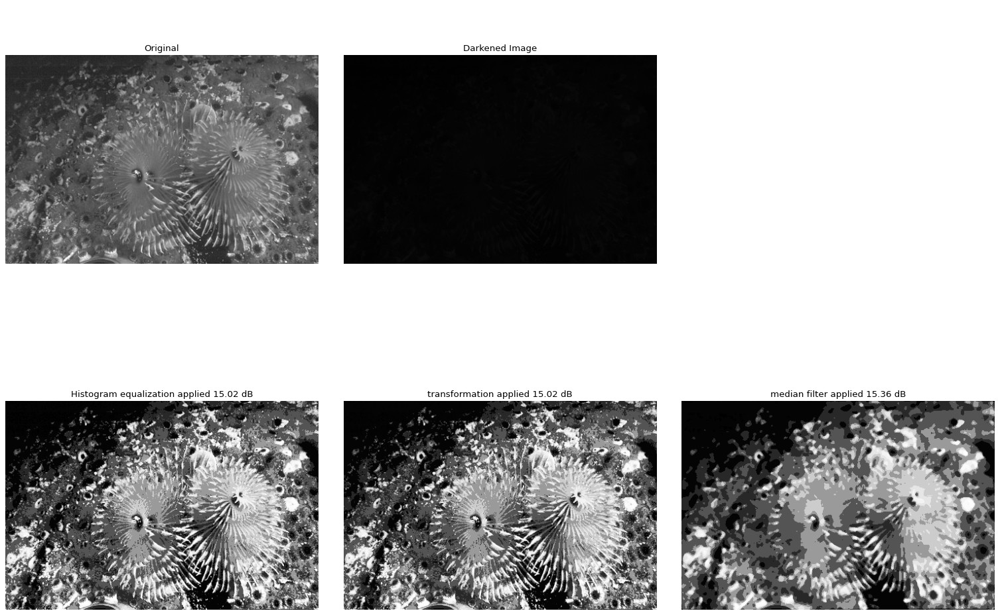

In [ ]:
im = Image.open(image_paths[4])
plot_transformation_hist_eq(im, 0.05)


(14.026141870208036, 13.445059787416652)

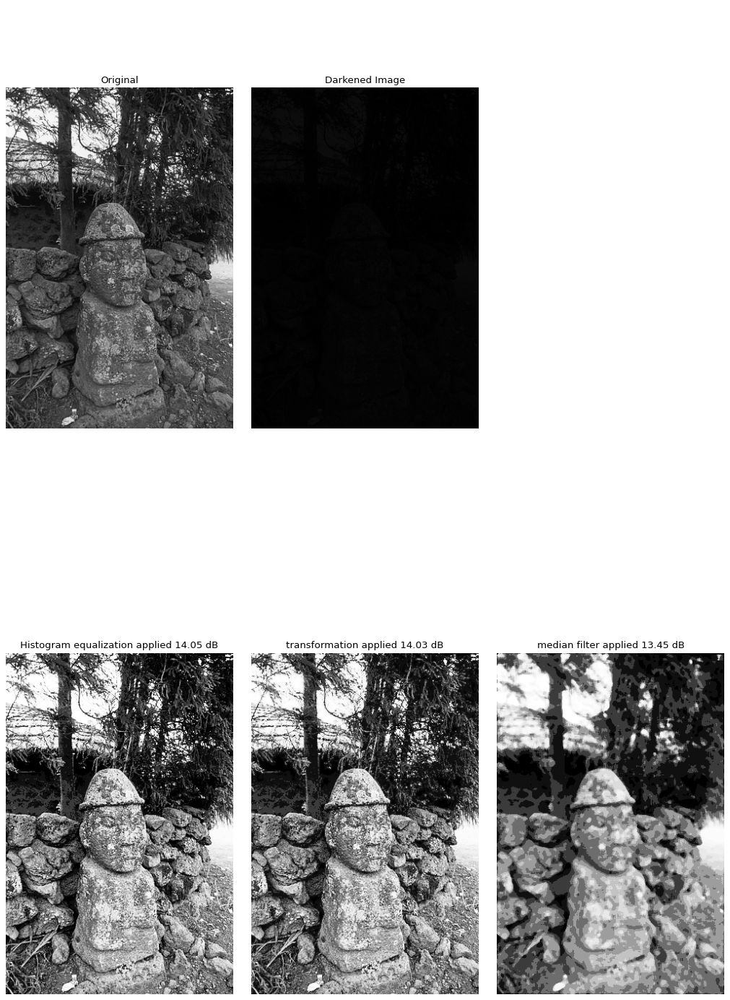

In [ ]:
im = Image.open(image_paths[79])
plot_transformation_hist_eq(im, 0.05)
